# 05. Generate SEOF SST Forecasts

Apply the fixed SEOF forecast model to the full OISST record and generate 0–12 month forecasts.

In [1]:
from pathlib import Path
import sys
import warnings

warnings.filterwarnings("ignore")

REPO_ROOT = Path("..").resolve()
SRC_DIR = REPO_ROOT / "src"

if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

from eams_seof.config import load_config, resolve_path

CONFIG_PATH = REPO_ROOT / "configs" / "manuscript.yml"
cfg = load_config(CONFIG_PATH, repo_root=REPO_ROOT)

print("Repository:", REPO_ROOT)
print("Config:", CONFIG_PATH)


Repository: /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1
Config: /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/configs/manuscript.yml


In [2]:
import numpy as np
import pandas as pd
import xarray as xr

from eams_seof.preprocessing import detrend_anomaly
from eams_seof.seof import project_seof
from eams_seof.forecast import (
    forecast_scores,
    reconstruct_forecast,
    restore_state,
    forecast_to_target,
    fixed_base_anomaly,
)
from eams_seof.calibration import (
    clim_correction,
)
from eams_seof.io import save_dataset

sst_path = resolve_path(REPO_ROOT, cfg["paths"]["oisst_smoothed"])
decomp_path = resolve_path(REPO_ROOT, cfg["paths"]["seof_model"])
forecast_model_path = resolve_path(REPO_ROOT, cfg["paths"]["forecast_model"])
forecast_output_path = resolve_path(REPO_ROOT, cfg["paths"]["forecast_output"])

sst = xr.open_dataset(sst_path)["sst"].sel(
    lat=slice(*cfg["domain"]["latitude"]),
    lon=slice(*cfg["domain"]["longitude"]),
)

decomp = xr.open_dataset(decomp_path)
model = xr.open_dataset(forecast_model_path)

aligned_patterns = decomp["aligned_eof_patterns"]
seof_mean = decomp["seof_mean"]
lag_weights = model["lag_weight"]

sea_mask = np.isfinite(sst).any("time")
training_period = tuple(cfg["periods"]["training"])

(
    detrended_sst,
    training_climatology,
    trend_coefficients,
    reference_decimal_year,
) = detrend_anomaly(
    sst,
    training_period=training_period,
    sea_mask=sea_mask,
)

monthly_scores = project_seof(
    detrended_sst,
    aligned_patterns,
    seof_mean,
)


## 1. Direct multi-lead component forecast

Generate direct forecasts for each lead.

In [3]:
forecast_component_scores = forecast_scores(
    monthly_projection_scores=monthly_scores,
    lag_weights=lag_weights,
    input_sequence_months=int(
        cfg["forecast"]["input_sequence_months"]
    ),
)

display(forecast_component_scores)


<xarray.DataArray 'forecast_component_score' (time: 403, lead: 13, mode: 3)>
array([[[        nan,         nan,         nan],
        [        nan,         nan,         nan],
        [        nan,         nan,         nan],
        ...,
        [        nan,         nan,         nan],
        [        nan,         nan,         nan],
        [        nan,         nan,         nan]],

       [[        nan,         nan,         nan],
        [        nan,         nan,         nan],
        [        nan,         nan,         nan],
        ...,
        [        nan,         nan,         nan],
        [        nan,         nan,         nan],
        [        nan,         nan,         nan]],

       [[        nan,         nan,         nan],
        [        nan,         nan,         nan],
        [        nan,         nan,         nan],
        ...,
...
        ...,
        [ 61.86431  , -10.366932 , -16.311852 ],
        [ 49.741528 , -18.868223 , -10.897897 ],
        [ 43.556293 , -36.550106 , -10.087278 ]],

       [[ 55.74466  , -38.0168   ,  14.405474 ],
        [ 36.630104 , -16.739487 ,  10.715905 ],
        [ 39.49501  ,   5.309648 ,  11.94694  ],
        ...,
        [ 52.24748  ,   3.459107 ,  16.052042 ],
        [ 48.015564 , -39.258114 ,  41.848827 ],
        [ 57.30698  ,  -6.581589 ,   2.5359502]],

       [[ 47.847965 , -41.390057 ,  10.661343 ],
        [ 43.641006 , -21.258791 ,  10.6385975],
        [ 54.213886 , -17.346043 ,  14.484463 ],
        ...,
        [ 64.16492  , -10.117837 ,  41.330845 ],
        [ 55.808365 , -15.972656 ,   2.0174987],
        [ 34.81888  , -50.1083   , -14.225004 ]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2026-07-01
  * lead     (lead) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * mode     (mode) int64 1 2 3

## 2. Reconstruct detrended target-month SST anomalies

In [4]:
detrended_forecast = reconstruct_forecast(
    forecast_component_scores,
    aligned_patterns,
    seof_mean,
    sea_mask=sea_mask,
)

display(detrended_forecast)


<xarray.DataArray 'sst_anomaly_forecast_detrended' (lead: 13, time: 403,
                                                    lat: 120, lon: 80)>
array([[[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]],

        [[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
...
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]],

        [[-0.3840348 , -0.34849507, -0.32051522, ..., -0.05755633,
          -0.04089987, -0.02607383],
         [-0.36840296, -0.3368004 , -0.31166866, ..., -0.06548105,
          -0.05134041, -0.03891014],
         [-0.35130906, -0.32434398, -0.3023403 , ..., -0.07999682,
          -0.06836127, -0.05834881],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]]]], dtype=float32)
Coordinates:
  * lead     (lead) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2026-07-01
  * lat      (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon      (lon) float64 120.1 120.4 120.6 120.9 ... 139.1 139.4 139.6 139.9

## 3. Restore the fixed 1993–2012 climatology and linear trend

In [5]:
forecast_absolute_init, _ = restore_state(
    detrended_anomaly_forecast=detrended_forecast,
    training_climatology=training_climatology,
    trend_coefficients=trend_coefficients,
    reference_decimal_year=reference_decimal_year,
)

forecast_absolute_target = forecast_to_target(
    forecast_absolute_init
)


## 4. Apply the causal rolling climatological correction

Use only information available before each initialization.

In [6]:
leads = forecast_absolute_init.lead.values.astype(int)
initialization_times = pd.DatetimeIndex(
    forecast_absolute_init.init.values
)

if bool(cfg["rolling_correction"]["enabled"]):
    correction_init = (
        clim_correction(
            uncorrected_forecast_target=forecast_absolute_target,
            observed_sst=sst,
            initialization_times=initialization_times,
            leads=leads,
            window_years=int(
                cfg["rolling_correction"]["window_years"]
            ),
            apply_from=cfg["rolling_correction"]["apply_from"],
            minimum_archive_months=int(
                cfg["rolling_correction"][
                    "minimum_archive_months"
                ]
            ),
            archive_start=cfg["rolling_correction"][
                "archive_start"
            ],
        )
    )
else:
    correction_init = xr.zeros_like(forecast_absolute_init)

forecast_absolute_corrected_init = (
    forecast_absolute_init + correction_init
).astype(np.float32)

forecast_absolute_corrected_target = forecast_to_target(
    forecast_absolute_corrected_init
)


## 5. Express forecasts relative to the fixed 1993–2016 climatology

In [7]:
fixed_base_period = tuple(
    cfg["periods"]["fixed_anomaly_base"]
)

forecast_fixed_base, observed_fixed_base = (
    fixed_base_anomaly(
        absolute_forecast_target=forecast_absolute_target,
        observed_sst=sst,
        fixed_base_period=fixed_base_period,
        sea_mask=sea_mask,
    )
)

forecast_fixed_base_corrected, _ = (
    fixed_base_anomaly(
        absolute_forecast_target=forecast_absolute_corrected_target,
        observed_sst=sst,
        fixed_base_period=fixed_base_period,
        sea_mask=sea_mask,
    )
)

print("Uncorrected:", forecast_fixed_base.shape)
print("Corrected  :", forecast_fixed_base_corrected.shape)


Uncorrected: (13, 415, 120, 80)
Corrected  : (13, 415, 120, 80)


## 6. Save forecast products

In [8]:
forecast_dataset = xr.Dataset(
    {
        "sst_forecast_absolute": forecast_absolute_target,
        "sst_forecast_absolute_corrected": (
            forecast_absolute_corrected_target
        ),
        "sst_forecast_fixed_base_anomaly": forecast_fixed_base,
        "sst_forecast_fixed_base_anomaly_corrected": (
            forecast_fixed_base_corrected
        ),
        "sst_observed_fixed_base_anomaly": observed_fixed_base,
    },
    attrs={
        "training_period": str(cfg["periods"]["training"]),
        "fixed_anomaly_base": str(
            cfg["periods"]["fixed_anomaly_base"]
        ),
        "input_sequence_months": int(
            cfg["forecast"]["input_sequence_months"]
        ),
        "maximum_lead_months": int(
            cfg["forecast"]["maximum_lead_months"]
        ),
        "lag_polarity_regularization": cfg[
            "forecast"
        ]["lag_polarity_regularization"],
        "rolling_correction_window_years": int(
            cfg["rolling_correction"]["window_years"]
        ),
    },
)

save_dataset(forecast_dataset, forecast_output_path)

print("Saved:", forecast_output_path)


Saved: /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/forecasts/forecasts.nc


## 7. Generate the mode-1 reference forecast

Use SEOF1 only to isolate the added ACC from modes 2–3. The comparison uses uncorrected forecasts for both models.


In [9]:
mode1_forecast_path = resolve_path(
    REPO_ROOT,
    cfg["paths"]["mode1_forecast_output"],
)

mode1_scores = monthly_scores.isel(mode=slice(0, 1))
mode1_weights = lag_weights.isel(mode=slice(0, 1))
mode1_patterns = aligned_patterns.isel(mode=slice(0, 1))

mode1_component_scores = forecast_scores(
    monthly_projection_scores=mode1_scores,
    lag_weights=mode1_weights,
    input_sequence_months=int(
        cfg["forecast"]["input_sequence_months"]
    ),
)

mode1_detrended = reconstruct_forecast(
    mode1_component_scores,
    mode1_patterns,
    seof_mean,
    sea_mask=sea_mask,
)

mode1_absolute_init, _ = restore_state(
    detrended_anomaly_forecast=mode1_detrended,
    training_climatology=training_climatology,
    trend_coefficients=trend_coefficients,
    reference_decimal_year=reference_decimal_year,
)

mode1_absolute = forecast_to_target(
    mode1_absolute_init
)

mode1_forecast, _ = fixed_base_anomaly(
    absolute_forecast_target=mode1_absolute,
    observed_sst=sst,
    fixed_base_period=fixed_base_period,
    sea_mask=sea_mask,
)

mode1_dataset = xr.Dataset(
    {
        "sst_forecast_fixed_base_anomaly": mode1_forecast,
    },
    attrs={
        "retained_modes": 1,
        "training_period": str(cfg["periods"]["training"]),
        "fixed_anomaly_base": str(cfg["periods"]["fixed_anomaly_base"]),
        "purpose": "mode-1 reference for added-skill analysis",
    },
)

save_dataset(mode1_dataset, mode1_forecast_path)
print("Saved:", mode1_forecast_path)


Saved: /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/forecasts/forecasts_mode1.nc


## 8. Latest-initialization forecast

Visualize forecasts from the latest initialization.

Latest target: Jul 2026
Targets: May 2026, Jun 2026, Jul 2026
Saved (corrected): /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/png/recent_ssta_forecasts.png
Saved (uncorrected): /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/png/recent_ssta_forecasts_uncorrected.png


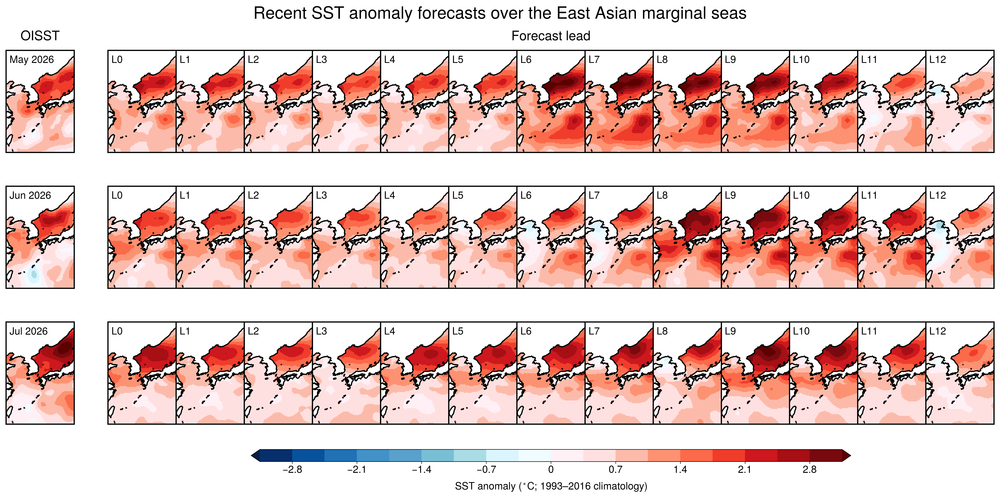

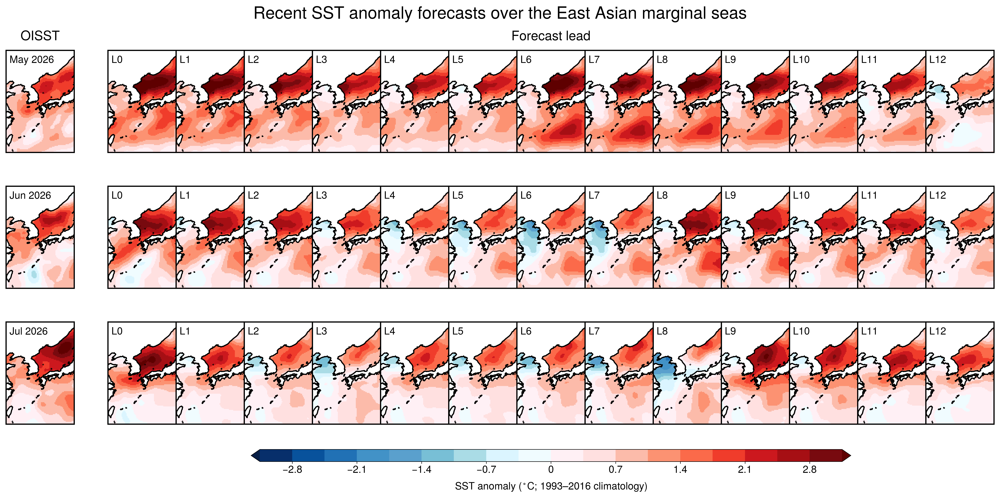

In [10]:
import proplot as pplt
import cmaps

BASE_FONT_SIZE = 20
SMALL_FONT = BASE_FONT_SIZE - 8
MID_FONT = BASE_FONT_SIZE - 4.5

pplt.rc.update({
    "figure.dpi": 300,
    "figure.facecolor": "white",
    "savefig.transparent": False,
    "savefig.bbox": "tight",
    "font.family": "sans-serif",
    "font.size": BASE_FONT_SIZE,
    "axes.titlesize": SMALL_FONT,
    "axes.labelsize": SMALL_FONT,
    "xtick.labelsize": SMALL_FONT,
    "ytick.labelsize": SMALL_FONT,
    "legend.fontsize": SMALL_FONT,
    "grid.linewidth": 0.5,
    "grid.alpha": 0.4,
    "tick.len": 2.5,
})

# Recent targets

sel_year = None
sel_month = None

n_rows = 3
n_cols = 14  # OISST + L0-L12
leads = np.arange(13)

obs_dates = pd.DatetimeIndex(
    observed_fixed_base.time.values
).dropna()

fcst_dates = pd.DatetimeIndex(
    forecast_fixed_base.target_time.values.ravel()
).dropna()

fcst_dates_corrected = pd.DatetimeIndex(
    forecast_fixed_base_corrected.target_time.values.ravel()
).dropna()

# Use dates available in observation and both forecast datasets.
common_dates = (
    obs_dates
    .intersection(fcst_dates)
    .intersection(fcst_dates_corrected)
    .sort_values()
)

if len(common_dates) == 0:
    raise ValueError(
        "No common target dates between OISST and forecasts."
    )

if sel_year is None and sel_month is None:
    last_target = common_dates[-1]

elif sel_year is not None and sel_month is not None:
    last_target = pd.Timestamp(
        year=sel_year,
        month=sel_month,
        day=1,
    )

    if last_target not in common_dates:
        raise ValueError(
            f"{last_target:%b %Y} is not available "
            "in both OISST and forecasts."
        )

else:
    raise ValueError(
        "Set both sel_year and sel_month, or leave both as None."
    )

target_dates = [
    last_target - pd.DateOffset(months=i)
    for i in range(n_rows - 1, -1, -1)
]

print(f"Latest target: {last_target:%b %Y}")
print(
    "Targets:",
    ", ".join(date.strftime("%b %Y") for date in target_dates)
)

# Plot settings

latlim = tuple(cfg["domain"]["latitude"])
lonlim = tuple(cfg["domain"]["longitude"])

base_start = pd.Timestamp(
    cfg["periods"]["fixed_anomaly_base"][0]
).year

base_end = pd.Timestamp(
    cfg["periods"]["fixed_anomaly_base"][1]
).year

cmap = cmaps.temp_19lev

levels = np.linspace(
    -3.15,
    3.15,
    19,
)

cb_ticks = np.arange(
    -2.8,
    2.8 + 1e-6,
    0.7,
)

# Corrected and uncorrected forecasts

plot_sets = {
    "corrected": {
        "data": forecast_fixed_base_corrected,
        "title": (
            "Recent SST anomaly forecasts over "
            "the East Asian marginal seas"
        ),
        "fig": "recent_forecast",
    },
    "uncorrected": {
        "data": forecast_fixed_base,
        "title": (
            "Recent SST anomaly forecasts over "
            "the East Asian marginal seas"
        ),
        "fig": "recent_forecast_uncorrected",
    },
}

for name, settings in plot_sets.items():

    forecast_data = settings["data"]

    # -----------------------------------------------------------------
    # Layout
    # -----------------------------------------------------------------

    parray = np.arange(
        1,
        n_rows * n_cols + 1,
    ).reshape(n_rows, n_cols)

    proj = pplt.Proj(
        "cyl",
        lon_0=180,
    )

    wspace_list = [0] * (n_cols - 1)
    wspace_list[0] = 2

    fig = pplt.figure(
        figwidth="42cm",
        tight=True,
    )

    axs = fig.subplots(
        array=parray,
        proj=proj,
        wspace=wspace_list,
        hspace=[2] * (n_rows - 1),
    )

    axs.format(
        suptitle=settings["title"],
        suptitle_kw={
            "weight": "normal",
            "size": BASE_FONT_SIZE,
        },
        suptitlepad="0.5em",
        ec="black",
        lw=1.4,
        coast=True,
        coastlinewidth=1.4,
        reso="med",
        grid=False,
        labels=False,
        latlim=latlim,
        lonlim=lonlim,
    )

    # -----------------------------------------------------------------
    # Plot recent targets
    # -----------------------------------------------------------------

    m = None

    for row_idx, selected_date in enumerate(target_dates):

        ax_start = row_idx * n_cols

        # -------------------------------------------------------------
        # OISST
        # -------------------------------------------------------------

        ax_obs = axs[ax_start]

        obs_data = observed_fixed_base.sel(
            time=selected_date
        )

        m = ax_obs.pcolormesh(
            obs_data,
            levels=levels,
            cmap=cmap,
            extend="both",
        )

        if row_idx == 0:
            ax_obs.format(
                title="OISST",
                titleweight="normal",
                titlesize=MID_FONT,
                titlepad=12,
            )

        ax_obs.text(
            0.05,
            0.95,
            f"{selected_date:%b %Y}",
            transform=ax_obs.transAxes,
            fontsize=SMALL_FONT,
            fontweight="normal",
            va="top",
        )

        # -------------------------------------------------------------
        # Forecasts: L0-L12
        # -------------------------------------------------------------

        for lead_idx, lead in enumerate(leads):

            ax_fcst = axs[
                ax_start + lead_idx + 1
            ]

            try:
                pdata = forecast_data.sel(
                    target_time=selected_date,
                    lead=int(lead),
                )

                m = ax_fcst.pcolormesh(
                    pdata,
                    levels=levels,
                    cmap=cmap,
                    extend="both",
                )

                if row_idx == 0 and lead == 6:
                    ax_fcst.format(
                        title="Forecast lead",
                        titleweight="normal",
                        titlesize=MID_FONT,
                        titlepad=12,
                    )

                ax_fcst.text(
                    0.05,
                    0.95,
                    f"L{lead}",
                    transform=ax_fcst.transAxes,
                    fontsize=SMALL_FONT,
                    fontweight="normal",
                    va="top",
                )

            except (KeyError, ValueError):
                ax_fcst.text(
                    0.5,
                    0.5,
                    "No Forecast",
                    ha="center",
                    va="center",
                    transform=ax_fcst.transAxes,
                    fontsize=SMALL_FONT,
                )

    # -----------------------------------------------------------------
    # Colorbar
    # -----------------------------------------------------------------

    if m is not None:
        cbar = fig.colorbar(
            m,
            loc="b",
            cols=(3, n_cols - 1),
            length=0.8,
            pad=1.5,
            extendsize=0.5,
            ticks=cb_ticks,
            tickminor=False,
            label=(
                rf"SST anomaly ($^\circ$C; "
                f"{base_start}\u2013{base_end} climatology)"
            ),
        )

        cbar.ax.xaxis.labelpad = 8

    # -----------------------------------------------------------------
    # Save
    # -----------------------------------------------------------------

    fig_path = REPO_ROOT / cfg["figs"][settings["fig"]]
    fig_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    fig.savefig(
        fig_path,
        dpi=600,
    )

    print(f"Saved ({name}): {fig_path}")

    fig.show()

## 9. Target-centered multi-lead forecast matrix

Visualize the same target months across different lead times.

In [11]:
import proplot as pplt
import cmaps

BASE_FONT_SIZE = 20
SMALL_FONT = BASE_FONT_SIZE - 8
MID_FONT = BASE_FONT_SIZE - 4.5

pplt.rc.update({
    "figure.dpi": 300,
    "figure.facecolor": "white",
    "savefig.transparent": False,
    "savefig.bbox": "tight",
    "font.family": "sans-serif",
    "font.size": BASE_FONT_SIZE,
    "axes.titlesize": SMALL_FONT,
    "axes.labelsize": SMALL_FONT,
    "xtick.labelsize": SMALL_FONT,
    "ytick.labelsize": SMALL_FONT,
    "legend.fontsize": SMALL_FONT,
    "grid.linewidth": 0.5,
    "grid.alpha": 0.4,
    "tick.len": 2.5,
})

# Future targets

n_rows = 4
n_cols = 12  # L1-L12
leads = np.arange(1, 13)

# Latest available OISST month
obs_dates = pd.DatetimeIndex(
    observed_fixed_base.time.values
).dropna()

last_obs_date = obs_dates.max()

# Forecast target dates
fcst_dates = (
    pd.DatetimeIndex(
        forecast_fixed_base.target_time.values.ravel()
    )
    .dropna()
    .unique()
    .sort_values()
)

fcst_dates_corrected = (
    pd.DatetimeIndex(
        forecast_fixed_base_corrected.target_time.values.ravel()
    )
    .dropna()
    .unique()
    .sort_values()
)

# Future dates available in both forecast datasets
future_dates = (
    fcst_dates
    .intersection(fcst_dates_corrected)
)

future_dates = future_dates[
    future_dates > last_obs_date
]

if len(future_dates) < n_rows:
    raise ValueError(
        f"Only {len(future_dates)} future target month(s) "
        f"are available after {last_obs_date:%b %Y}."
    )

target_dates = future_dates[:n_rows]

print(f"Latest OISST: {last_obs_date:%b %Y}")
print(
    "Future targets:",
    ", ".join(date.strftime("%b %Y") for date in target_dates)
)

# Plot settings

latlim = tuple(cfg["domain"]["latitude"])
lonlim = tuple(cfg["domain"]["longitude"])

base_start = pd.Timestamp(
    cfg["periods"]["fixed_anomaly_base"][0]
).year

base_end = pd.Timestamp(
    cfg["periods"]["fixed_anomaly_base"][1]
).year

cmap = cmaps.temp_19lev

levels = np.linspace(
    -3.15,
    3.15,
    19,
)

cb_ticks = np.arange(
    -2.8,
    2.8 + 1e-6,
    0.7,
)

# Corrected and uncorrected forecasts

plot_sets = {
    "corrected": {
        "data": forecast_fixed_base_corrected,
        "title": (
            "Future SST anomaly forecasts over "
            "the East Asian marginal seas"
        ),
        "fig": "future_forecast",
    },
    "uncorrected": {
        "data": forecast_fixed_base,
        "title": (
            "Future SST anomaly forecasts over "
            "the East Asian marginal seas"
        ),
        "fig": "future_forecast_uncorrected",
    },
}

for name, settings in plot_sets.items():

    forecast_data = settings["data"]

    # -----------------------------------------------------------------
    # Layout
    # -----------------------------------------------------------------

    parray = np.arange(
        1,
        n_rows * n_cols + 1,
    ).reshape(n_rows, n_cols)

    proj = pplt.Proj(
        "cyl",
        lon_0=180,
    )

    wspace_list = [0] * (n_cols - 1)

    fig = pplt.figure(
        figwidth="42cm",
        tight=True,
    )

    axs = fig.subplots(
        array=parray,
        proj=proj,
        wspace=wspace_list,
        hspace=[2] * (n_rows - 1),
    )

    leftlabels = [
        date.strftime("%b %Y")
        for date in target_dates
    ]

    axs.format(
        suptitle=settings["title"],
        suptitle_kw={
            "weight": "normal",
            "size": BASE_FONT_SIZE,
        },
        suptitlepad="0.5em",
        ec="black",
        lw=1.4,
        coast=True,
        coastlinewidth=1.4,
        reso="med",
        grid=False,
        labels=False,
        latlim=latlim,
        lonlim=lonlim,
        leftlabels=leftlabels,
        leftlabels_kw={
            "weight": "normal",
            "size": MID_FONT,
            "rotation": 0,
        },
    )

    # -----------------------------------------------------------------
    # Plot future targets
    # -----------------------------------------------------------------

    m = None

    for row_idx, selected_date in enumerate(target_dates):

        ax_start = row_idx * n_cols

        for lead_idx, lead in enumerate(leads):

            ax_fcst = axs[
                ax_start + lead_idx
            ]

            try:
                pdata = forecast_data.sel(
                    target_time=selected_date,
                    lead=int(lead),
                )

                # Some target-lead combinations can exist as all-NaN.
                if not bool(
                    pdata.notnull().any()
                ):
                    ax_fcst.text(
                        0.05,
                        0.95,
                        f"L{lead}",
                        transform=ax_fcst.transAxes,
                        fontsize=SMALL_FONT,
                        fontweight="normal",
                        va="top",
                    )
                    continue

                m = ax_fcst.pcolormesh(
                    pdata,
                    levels=levels,
                    cmap=cmap,
                    extend="both",
                )

                # Column heading
                if row_idx == 0 and lead == 6:
                    ax_fcst.text(
                        1.0,
                        1.05,
                        "Forecast lead",
                        transform=ax_fcst.transAxes,
                        fontsize=MID_FONT,
                        fontweight="normal",
                        ha="center",
                        va="bottom",
                        clip_on=False,
                    )

                # Lead label inside each panel
                ax_fcst.text(
                    0.05,
                    0.95,
                    f"L{lead}",
                    transform=ax_fcst.transAxes,
                    fontsize=SMALL_FONT,
                    fontweight="normal",
                    va="top",
                )

            except (KeyError, ValueError):
                continue

    # -----------------------------------------------------------------
    # Colorbar
    # -----------------------------------------------------------------

    if m is not None:
        cbar = fig.colorbar(
            m,
            loc="b",
            cols=(2, n_cols - 1),
            length=0.8,
            pad=1.5,
            extendsize=0.5,
            ticks=cb_ticks,
            tickminor=False,
            label=(
                rf"SST anomaly ($^\circ$C; "
                f"{base_start}\u2013{base_end} climatology)"
            ),
        )

        cbar.ax.xaxis.labelpad = 8

    # -----------------------------------------------------------------
    # Save
    # -----------------------------------------------------------------

    fig_path = (
        REPO_ROOT
        / cfg["figs"][settings["fig"]]
    )

    fig_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    fig.savefig(
        fig_path,
        dpi=600,
    )

    print(f"Saved ({name}): {fig_path}")

    fig.show()

Latest OISST: Jul 2026
Future targets: Aug 2026, Sep 2026, Oct 2026, Nov 2026
Saved (corrected): /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/png/future_ssta_forecasts.png
Saved (uncorrected): /Users/jhyun/Library/CloudStorage/OneDrive-개인/jhyun91/GloSea6-SSTA-EAMS-SEOF_v1/outputs/png/future_ssta_forecasts_uncorrected.png
